<a href="https://colab.research.google.com/github/jana-jovicic/Neural-Style-Transfer/blob/master/01_Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: images/content16.jpg    
  inflating: images/content15.jpg    
  inflating: images/van-gogh-the-starry-night.jpg  
  inflating: images/van-gogh-landscape-with-olive-trees.jpg  
  inflating: images/seurat-A-Sunday-on-La-Grande-Jatte.jpg  
  inflating: images/picasso-muse.jpg  
  inflating: images/munch-the-scream.jpg  
  inflating: images/manet-water-lilies.jpg  
  inflating: images/klimt-The-Tree-Of-Life.jpg  
  inflating: images/klimt-the-kiss.jpg  
  inflating: images/hokusai-the-great-wave-off-kanagawa.jpg  
  inflating: images/friedrich-the-wanderer-above-the-sea-of-fog.jpg  
  inflating: images/dali-spider-of-the-evening.jpg  
  inflating: images/dali-melting-watch.jpg  
  inflating: images/dali-galatea-of-the-spheres.jpg  
  inflating: images/content14.jpg    
  inflating: images/content13.jpg    
  inflating: images/content12.jpg    
  inflating: images/content11.jpg    
  inflating: images/content10.jpg    
  inflating: ima

In [4]:
!unzip 01_outputs.zip

Archive:  01_outputs.zip
   creating: 01_outputs/
  inflating: 01_outputs/content6-munch-the-scream-(vgg19).jpg  
  inflating: 01_outputs/content6-munch-the-scream-(vgg16).jpg  
  inflating: 01_outputs/content5-munch-the-scream-(vgg16).jpg  
  inflating: 01_outputs/content5-munch-the-scream-(vgg19).jpg  
  inflating: 01_outputs/content15-munch-the-scream-(vgg16).jpg  
  inflating: 01_outputs/content5-van-gogh-the-starry-night-(vgg16).jpg  
  inflating: 01_outputs/content3-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg  
  inflating: 01_outputs/content14-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg  
  inflating: 01_outputs/content1-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg  
  inflating: 01_outputs/content1-van-gogh-the-starry-night-(vgg16).jpg  
  inflating: 01_outputs/content11-van-gogh-the-starry-night-(vgg16).jpg  
  inflating: 01_outputs/content11-munch-the-scream-(vgg16).jpg  


In [0]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import time
import functools
import os
import IPython.display

%tensorflow_version 2.x
import tensorflow as tf
from tensorflow.keras.preprocessing import image as kp_image
from tensorflow.keras.models import Model

In [0]:
def load_image(image_path):
  image = Image.open(image_path)
  old_dimensions = image.size
  image = image.resize((512, 512), Image.ANTIALIAS)
  image = kp_image.img_to_array(image) 
  # add new axis to get shape (batch_size, h, w, d)
  image = np.expand_dims(image, axis=0)
  return image, old_dimensions


def show_image(image, title):

  # if additional axis was added, remove it
  if len(image.shape) > 3:
    image = np.squeeze(image, axis=0)
  image = image.astype('uint8')

  fig, axis1 = plt.subplots(1, 1, figsize=(14, 7))
  axis1.imshow(image)
  axis1.set_title(title)
  plt.show()

In [67]:
content_image_path = 'images' + os.path.sep + 'content6.jpg'
style_image_path = 'images' + os.path.sep + 'munch-the-scream.jpg'

content_image, _ = load_image(content_image_path)
style_image, _6 = load_image(style_image_path)

content_image.shape, style_image.shape

((1, 512, 512, 3), (1, 512, 512, 3))

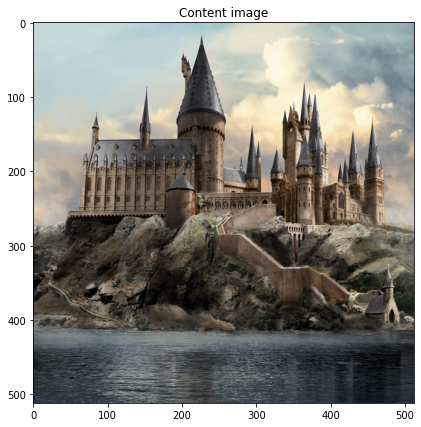

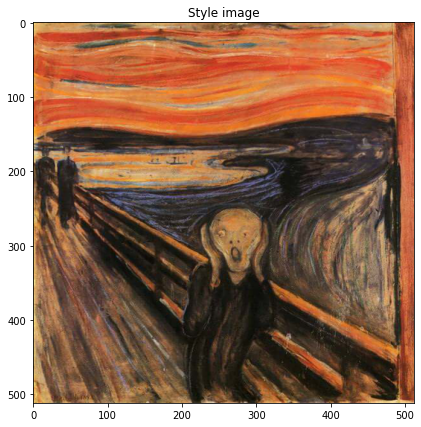

In [68]:
show_image(content_image, 'Content image')
show_image(style_image, 'Style image')

In [8]:
vgg19_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
for layer in vgg19_model.layers:
  print(layer.name)

80142336/80134624 [==============================] - 2s 0us/step
input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [9]:
vgg16_model = tf.keras.applications.VGG16(include_top=False, weights='imagenet')
for layer in vgg16_model.layers:
  print(layer.name)

58892288/58889256 [==============================] - 1s 0us/step
input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool


In [0]:
content_layers = ['block5_conv2'] 
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
content_layers_number = len(content_layers)
style_layers_number = len(style_layers)

In [0]:
def create_small_vgg_model(vgg_model, content_layers, style_layers):
  vgg_model.trainable = False
  output_layers = [vgg_model.get_layer(layer).output for layer in style_layers + content_layers]
  model = Model(vgg_model.input, output_layers)
  return model

In [0]:
def deprocess_img(processed_img):

  vgg_means = np.array([103.939, 116.779, 123.68])

  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  if len(x.shape) != 3:
    raise ValueError("Dimension of image [1, height, width, channel] or [height, width, channel]")
  
  # inverse of the preprocessing step
  x[:, :, 0] += vgg_means[0]
  x[:, :, 1] += vgg_means[1]
  x[:, :, 2] += vgg_means[2]
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

In [0]:
def calculate_content_loss(F, P):
  '''
    Input: F, P - feature representations of generated and original image
  '''
  return tf.reduce_mean((F - P)**2)

In [0]:
def gram_matrix(F, N, M):
  '''
    Input: F - tensor; feature represenatation of image in given layer
           N - number of distinctive filters (and feature maps) in given layer
           M - size of each feature map in given layer (hight*width of map)
  '''
  # Reshape the tensor so it is a 2-dim matrix
  F = tf.reshape(F, (M, N))
  return tf.matmul(tf.transpose(F), F)

In [0]:
def calculate_style_loss_in_one_layer(g, a):
  ''' 
  Calculate the style loss at a certain layer
  Input:  a - feature representation of the style image at given layer
          g - feature representation of the generated image at given layer
  '''
  height, width, N = g.get_shape().as_list()
  M = height * width
  G = gram_matrix(g, N, M)
  A = gram_matrix(a, N, M)
  E = tf.reduce_sum((G - A) ** 2) / (4 * (N**2) * (M**2))
  #E = tf.reduce_sum((G - A) ** 2) / (4.0 * N * M)
  #E = tf.reduce_mean((G - A) ** 2)
  return E

In [0]:
def calculate_loss(model, style_weight, content_weight, initial_img, style_features, content_features):

  model_outputs = model(initial_img)
  
  style_output_features = model_outputs[:style_layers_number]
  content_output_features = model_outputs[style_layers_number:]
  
  style_loss = 0
  content_loss = 0

  # Accumulate style losses from all layers
  # We equally weight each contribution of each loss layer
  w_style = 1.0 / float(style_layers_number)
  for target_style, generated_style in zip(style_features, style_output_features):
    style_loss += w_style * calculate_style_loss_in_one_layer(generated_style[0], target_style)
    
  # Accumulate content losses from all layers 
  #w_content = 1.0 / float(content_layers_number)
  for target_content, generated_content in zip(content_features, content_output_features):
    content_loss += calculate_content_loss(generated_content[0], target_content)
  
  style_loss *= style_weight
  content_loss *= content_weight

  # Get total loss
  total_loss = style_loss + content_loss 
  return total_loss, style_loss, content_loss

In [0]:
def stylize_image(content_path, style_path, vgg_model, iterations=500, content_weight=1000.0, style_weight=0.01, print_images=False, show_loss=False): 
  
  model = create_small_vgg_model(vgg_model, content_layers, style_layers)
  for layer in model.layers:
    layer.trainable = False

  content_img, old_dimensions_content = load_image(content_path)
  style_img, _ = load_image(style_path)
  initial_img, _ = load_image(content_path)

  content_img = tf.keras.applications.vgg19.preprocess_input(content_img)
  style_img = tf.keras.applications.vgg19.preprocess_input(style_img)
  initial_img = tf.keras.applications.vgg19.preprocess_input(initial_img)
  initial_img = tf.Variable(initial_img, dtype=tf.float32)  

  style_outputs = model(style_img)
  content_outputs = model(content_img)
  #print(style_outputs)

  # Get the style and content feature representations from model  
  style_features = [style_layer[0] for style_layer in style_outputs[:style_layers_number]]
  content_features = [content_layer[0] for content_layer in content_outputs[style_layers_number:]]
  
  optimizer = tf.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=1e-1)

  best_img =  None
  best_loss = float('inf')
  losses = []

  display_image_interval = iterations / 10
  
  start_time = time.time()
  
  for i in range(iterations):
    
    with tf.GradientTape() as tape: 
      total_loss, style_score, content_score = calculate_loss(model, style_weight, content_weight, initial_img, style_features, content_features)
      gradients = tape.gradient(total_loss, initial_img)
    
    optimizer.apply_gradients([(gradients, initial_img)])

    losses.append(total_loss)

    if total_loss < best_loss:
      best_loss = total_loss
      best_img = deprocess_img(initial_img.numpy())

    if print_images:
      if (i % display_image_interval == 0) or (i == iterations-1):
        plot_img = initial_img.numpy()
        plot_img = deprocess_img(plot_img)
        show_image(plot_img, 'Stylized image')
        print('Iteration: {0}, total loss: {1}, style score: {2}, content score: {3}'
        .format(i, total_loss, style_score, content_score))

  if show_loss:
    plt.plot(range(iterations), losses)
    plt.show()

  print('Stylizing of image took {0}s'.format(time.time() - start_time))
  #print(best_loss)

  best_img = Image.fromarray(best_img).resize(old_dimensions_content, Image.ANTIALIAS)

  return best_img, best_loss 

In [0]:
def show_stylized_image(stylized_image, k=1):
  # convert pixel size to inch size:  inch_size = pixel_size * 1/96
  # and show image k times smaller
  plt.figure(figsize=(stylized_image.size[0]/(96*k), stylized_image.size[1]/(96*k)))
  plt.imshow(stylized_image)
  plt.axis('off')
  plt.show()

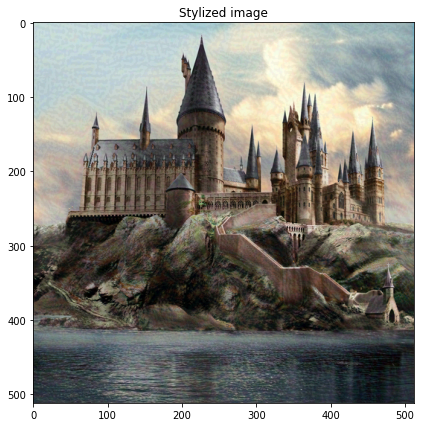

Iteration: 0, total loss: 224806512.0, style score: 224806512.0, content score: 0.0


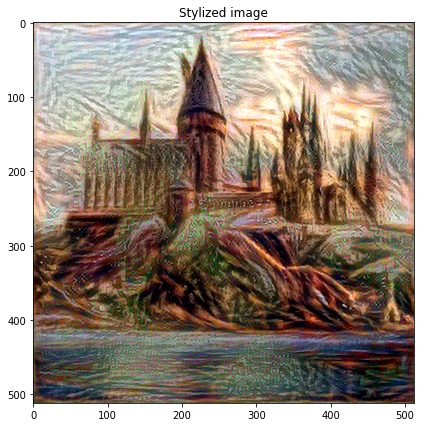

Iteration: 50, total loss: 13093322.0, style score: 10896799.0, content score: 2196523.5


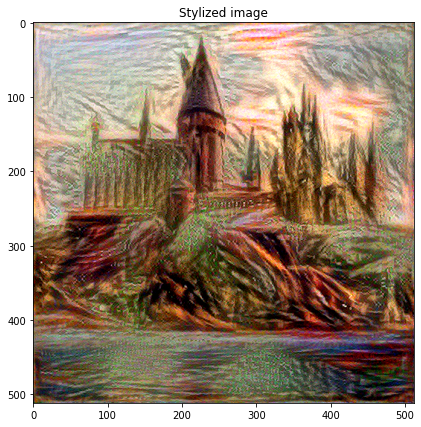

Iteration: 100, total loss: 6979716.0, style score: 4999138.0, content score: 1980578.0


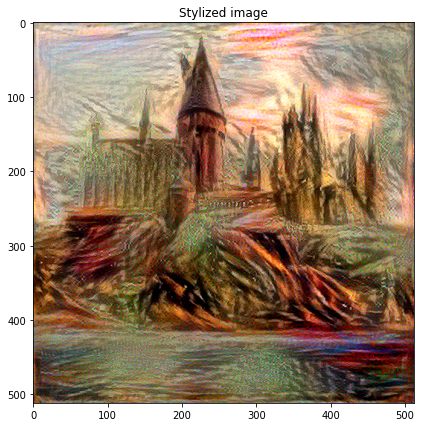

Iteration: 150, total loss: 4508723.5, style score: 2800532.5, content score: 1708191.0


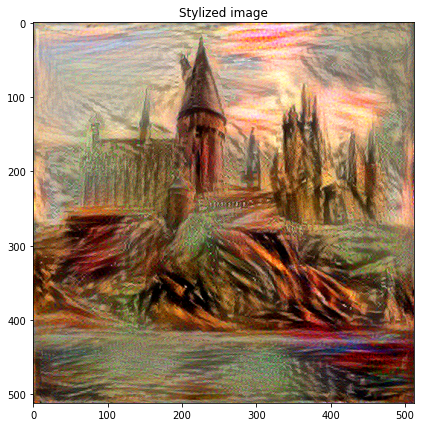

Iteration: 200, total loss: 3195322.25, style score: 1750426.0, content score: 1444896.25


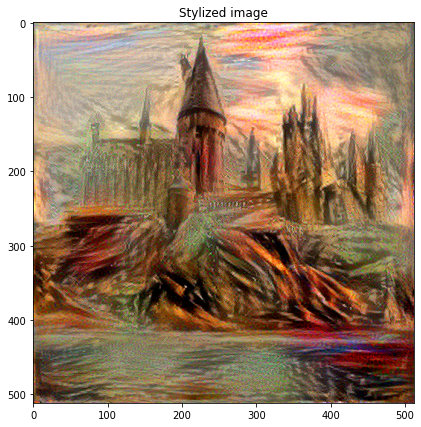

Iteration: 250, total loss: 2415457.5, style score: 1172517.5, content score: 1242940.0


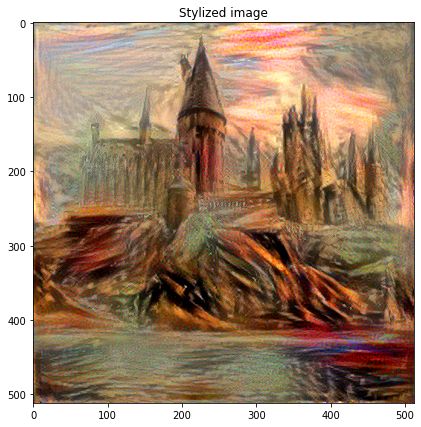

Iteration: 300, total loss: 1935599.0, style score: 857379.625, content score: 1078219.375


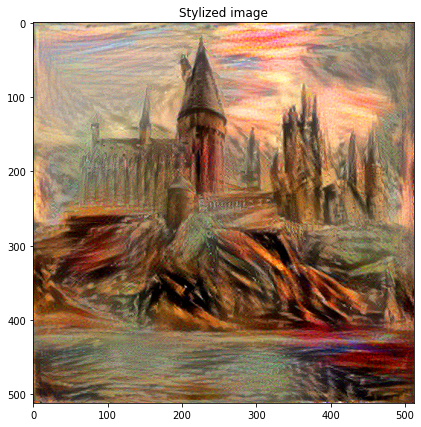

Iteration: 350, total loss: 1622220.5, style score: 668927.875, content score: 953292.5625


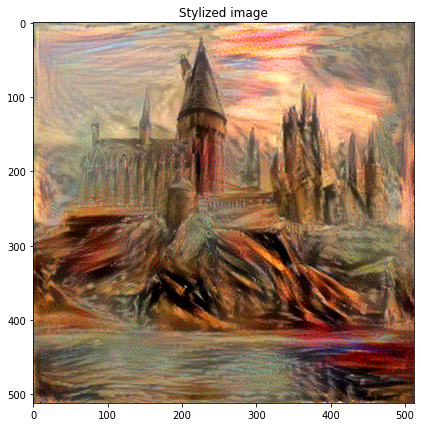

Iteration: 400, total loss: 1412857.25, style score: 549168.0625, content score: 863689.1875


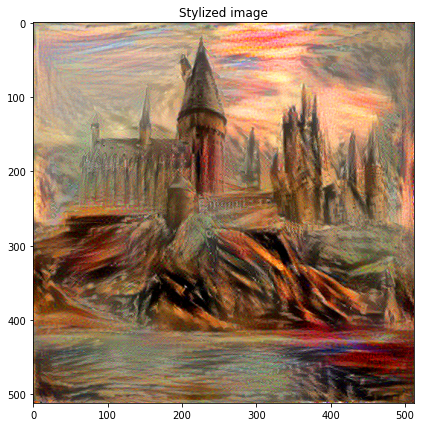

Iteration: 450, total loss: 1265534.5, style score: 470642.34375, content score: 794892.125


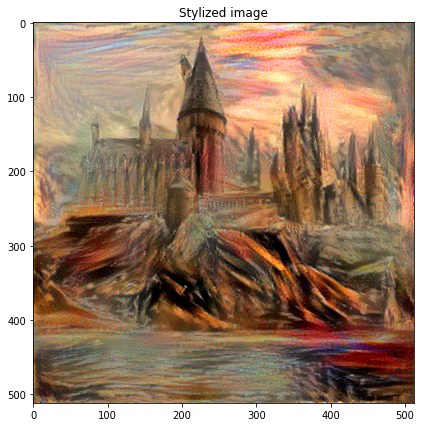

Iteration: 499, total loss: 1160506.0, style score: 419994.65625, content score: 740511.375


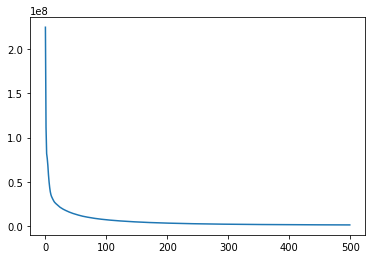

Stylizing of image took 191.34781074523926s
tf.Tensor(1160506.0, shape=(), dtype=float32)


In [76]:
stylized_image, loss = stylize_image(content_path='images'+os.path.sep+'content6.jpg', 
                                     style_path='images'+os.path.sep+'munch-the-scream.jpg',  
                                     vgg_model=vgg19_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1, 
                                     print_images=True, show_loss=True)
stylized_image.save('01_outputs' + os.path.sep + 'content6-munch-the-scream-(vgg19).jpg')

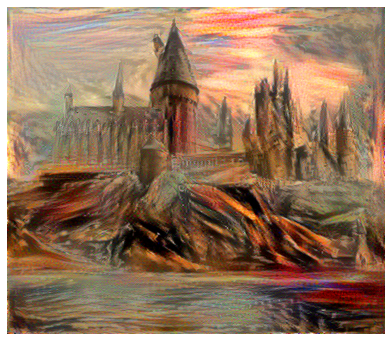

In [98]:
show_stylized_image(stylized_image, 3)

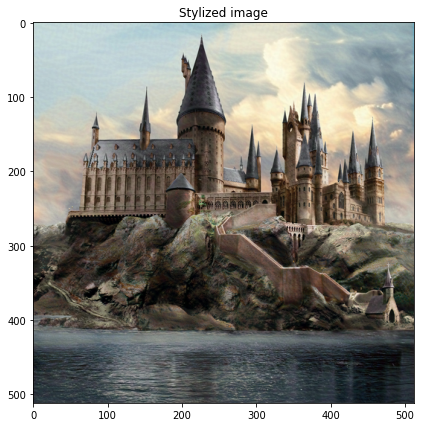

Iteration: 0, total loss: 14234554.0, style score: 14234554.0, content score: 0.0


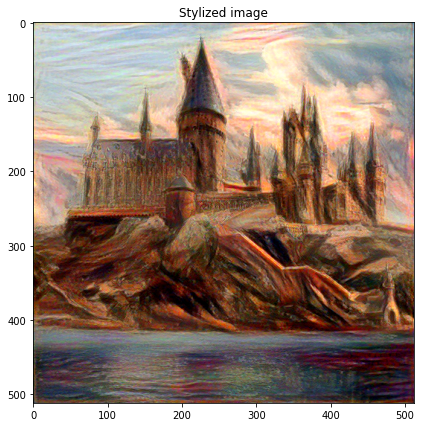

Iteration: 50, total loss: 939594.75, style score: 703661.3125, content score: 235933.46875


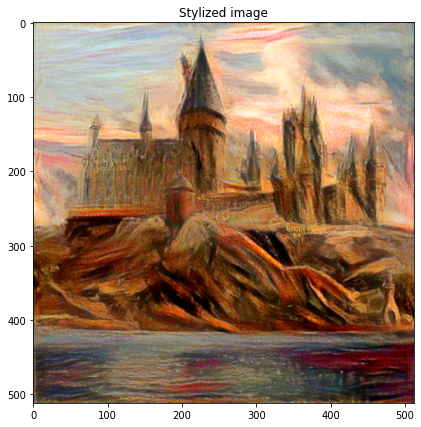

Iteration: 100, total loss: 597951.625, style score: 410520.59375, content score: 187431.015625


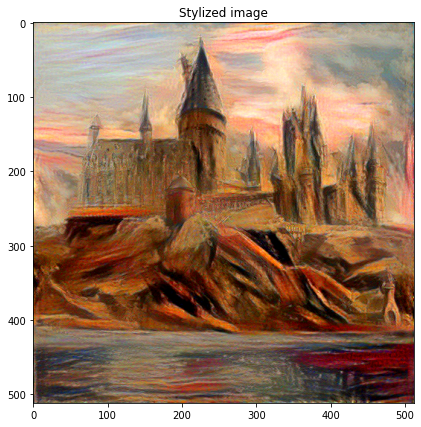

Iteration: 150, total loss: 398087.5, style score: 243603.5, content score: 154484.015625


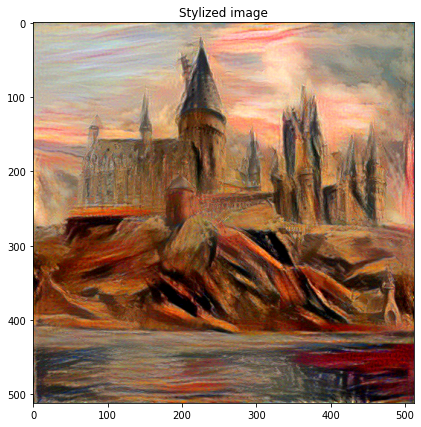

Iteration: 200, total loss: 294725.46875, style score: 164675.8125, content score: 130049.6640625


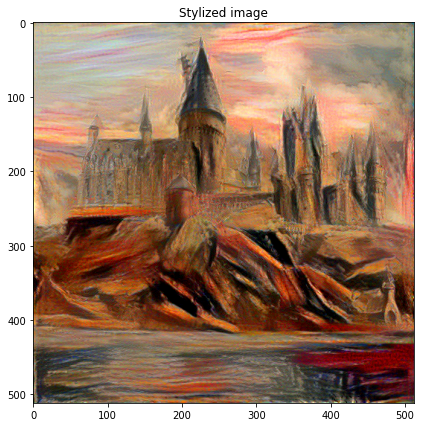

Iteration: 250, total loss: 240327.1875, style score: 128397.0546875, content score: 111930.1328125


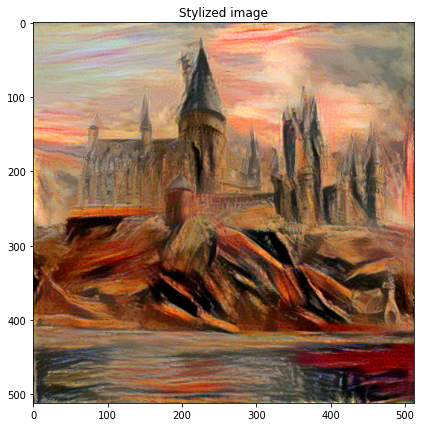

Iteration: 300, total loss: 201710.375, style score: 103663.1171875, content score: 98047.265625


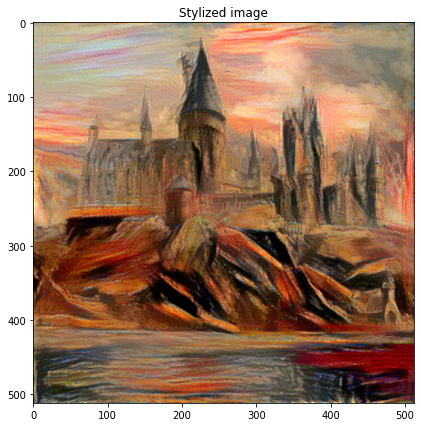

Iteration: 350, total loss: 173549.21875, style score: 86066.3984375, content score: 87482.828125


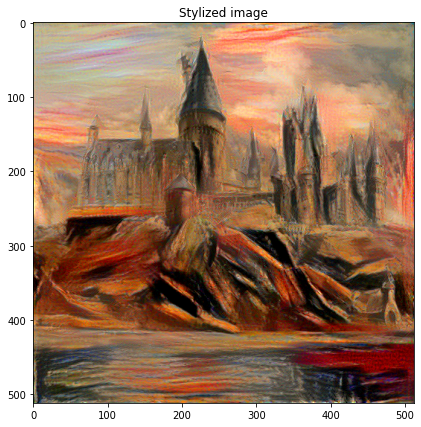

Iteration: 400, total loss: 153999.71875, style score: 74189.703125, content score: 79810.0078125


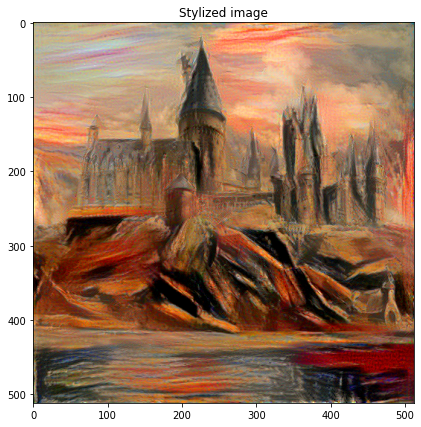

Iteration: 450, total loss: 139991.859375, style score: 65840.5234375, content score: 74151.3359375


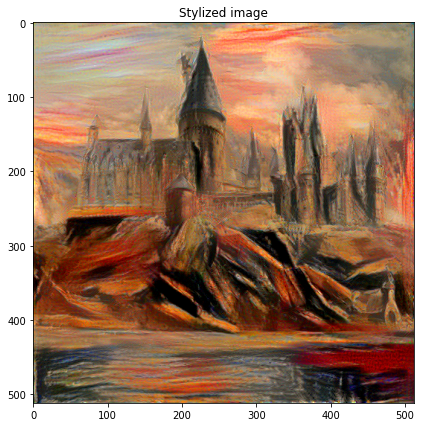

Iteration: 499, total loss: 129695.984375, style score: 59881.66796875, content score: 69814.3203125


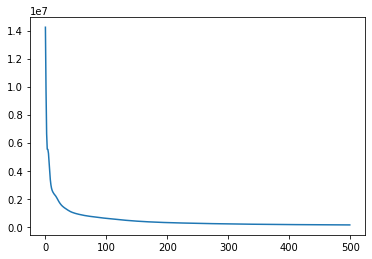

Stylizing of image took 167.99212908744812s
tf.Tensor(129695.984, shape=(), dtype=float32)


In [100]:
stylized_image, loss = stylize_image(content_path = 'images' + os.path.sep + 'content6.jpg', 
                                     style_path = 'images' + os.path.sep + 'munch-the-scream.jpg', 
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1, 
                                     print_images=True, show_loss=True)
stylized_image.save('01_outputs' + os.path.sep + 'content6-munch-the-scream-(vgg16).jpg')

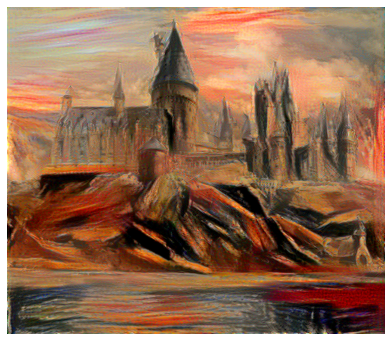

In [111]:
show_stylized_image(stylized_image, 3)

Stylizing of image took 164.29489398002625s
tf.Tensor(189987.36, shape=(), dtype=float32)


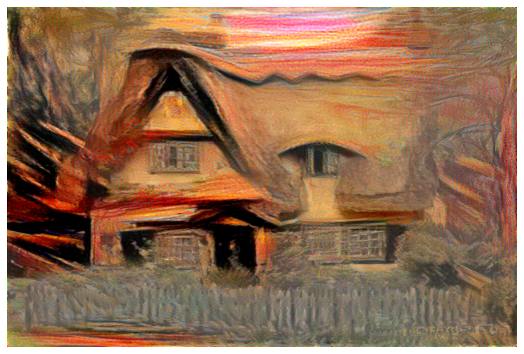

In [113]:
stylized_image2, loss2 = stylize_image(content_path = 'images' + os.path.sep + 'content5.jpg', 
                                     style_path = 'images' + os.path.sep + 'munch-the-scream.jpg', 
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image2.save('01_outputs' + os.path.sep + 'content5-munch-the-scream-(vgg16).jpg')
show_stylized_image(stylized_image2)

Stylizing of image took 188.52414441108704s


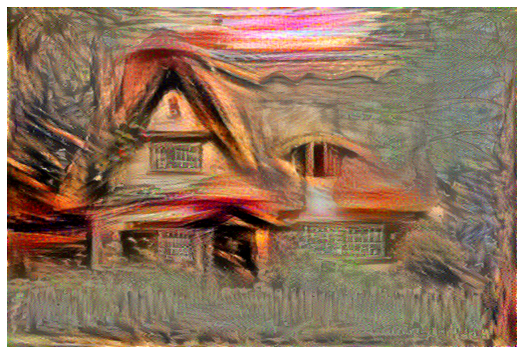

In [116]:
stylized_image3, loss3 = stylize_image(content_path = 'images' + os.path.sep + 'content5.jpg', 
                                     style_path = 'images' + os.path.sep + 'munch-the-scream.jpg', 
                                     vgg_model = vgg19_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image3.save('01_outputs' + os.path.sep + 'content5-munch-the-scream-(vgg19).jpg')
show_stylized_image(stylized_image3)

In [118]:
stylized_image4, loss4 = stylize_image(content_path = 'images' + os.path.sep + 'content15.jpg', 
                                     style_path = 'images' + os.path.sep + 'munch-the-scream.jpg', 
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image4.save('01_outputs' + os.path.sep + 'content15-munch-the-scream-(vgg16).jpg')

Stylizing of image took 164.83864998817444s


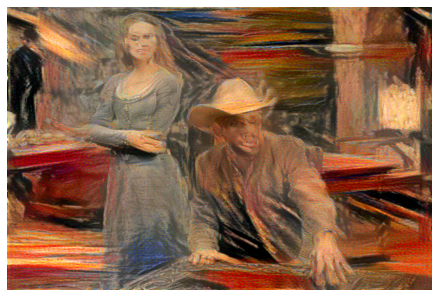

In [119]:
show_stylized_image(stylized_image4, 2)

In [120]:
stylized_image5, loss5 = stylize_image(content_path = 'images' + os.path.sep + 'content11.jpg', 
                                     style_path = 'images' + os.path.sep + 'munch-the-scream.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image5.save('01_outputs' + os.path.sep + 'content11-munch-the-scream-(vgg16).jpg')

Stylizing of image took 164.11666989326477s


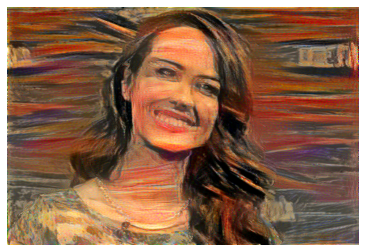

In [121]:
show_stylized_image(stylized_image5)

In [122]:
stylized_image6, loss6 = stylize_image(content_path = 'images' + os.path.sep + 'content11.jpg', 
                                     style_path = 'images' + os.path.sep + 'van-gogh-the-starry-night.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image6.save('01_outputs' + os.path.sep + 'content11-van-gogh-the-starry-night-(vgg16).jpg')

Stylizing of image took 164.51797580718994s


In [124]:
stylized_image7, loss7 = stylize_image(content_path = 'images' + os.path.sep + 'content1.jpg', 
                                     style_path = 'images' + os.path.sep + 'van-gogh-the-starry-night.jpg', 
                                     vgg_model=vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image7.save('01_outputs' + os.path.sep + 'content1-van-gogh-the-starry-night-(vgg16).jpg')

Stylizing of image took 164.26606607437134s


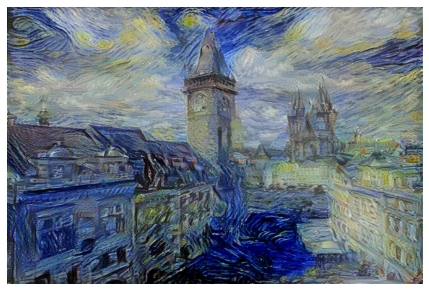

In [125]:
show_stylized_image(stylized_image7, 3)

In [126]:
stylized_image8, loss8 = stylize_image(content_path = 'images' + os.path.sep + 'content1.jpg',
                                     style_path = 'images' + os.path.sep + 'hokusai-the-great-wave-off-kanagawa.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image8.save('01_outputs' + os.path.sep + 'content1-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg')

Stylizing of image took 164.8078417778015s


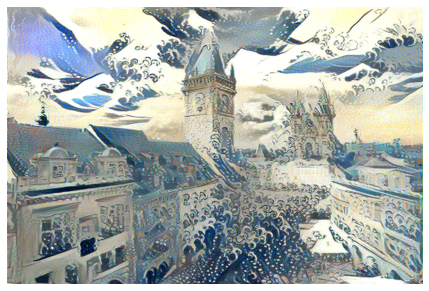

In [128]:
show_stylized_image(stylized_image8, 3)

In [127]:
stylized_image9, loss9 = stylize_image(content_path = 'images' + os.path.sep + 'content14.jpg',
                                     style_path = 'images' + os.path.sep + 'hokusai-the-great-wave-off-kanagawa.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image9.save('01_outputs' + os.path.sep + 'content14-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg')

Stylizing of image took 164.41604161262512s


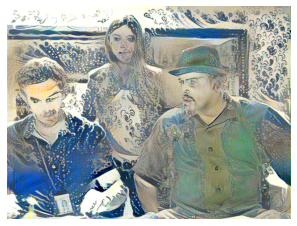

In [129]:
show_stylized_image(stylized_image9)

In [130]:
stylized_image10, loss10 = stylize_image(content_path = 'images' + os.path.sep + 'content3.jpg', 
                                     style_path = 'images' + os.path.sep + 'hokusai-the-great-wave-off-kanagawa.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image10.save('01_outputs' + os.path.sep + 'content3-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg')

Stylizing of image took 164.8711805343628s


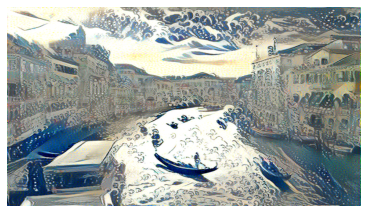

In [131]:
show_stylized_image(stylized_image10)

In [132]:
stylized_image11, loss11 = stylize_image(content_path = 'images' + os.path.sep + 'content7.jpg', 
                                     style_path = 'images' + os.path.sep + 'picasso-muse.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image11.save('01_outputs' + os.path.sep + 'content7-picasso-muse-(vgg16).jpg')

Stylizing of image took 164.3445372581482s


In [133]:
stylized_image12, loss12 = stylize_image(content_path = 'images' + os.path.sep + 'content13.jpg', 
                                     style_path = 'images' + os.path.sep + 'picasso-muse.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image12.save('01_outputs' + os.path.sep + 'content13-picasso-muse-(vgg16).jpg')

Stylizing of image took 164.73108434677124s


In [134]:
stylized_image13, loss13 = stylize_image(content_path = 'images' + os.path.sep + 'content4.jpeg', 
                                     style_path = 'images' + os.path.sep + 'picasso-muse.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image13.save('01_outputs' + os.path.sep + 'content4-picasso-muse-(vgg16).jpg')

Stylizing of image took 164.08376908302307s


In [137]:
stylized_image14, loss14 = stylize_image(content_path = 'images' + os.path.sep + 'content13.jpg', 
                                     style_path = 'images' + os.path.sep + 'klimt-the-kiss.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image14.save('01_outputs' + os.path.sep + 'content13-klimt-the-kiss-(vgg16).jpg')

Stylizing of image took 164.50852274894714s


In [138]:
stylized_image15, loss15 = stylize_image(content_path = 'images' + os.path.sep + 'content10.jpg', 
                                     style_path = 'images' + os.path.sep + 'klimt-the-kiss.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image15.save('01_outputs' + os.path.sep + 'content10-klimt-the-kiss-(vgg16).jpg')

Stylizing of image took 164.3527491092682s


In [139]:
stylized_image16, loss16 = stylize_image(content_path = 'content16.png', 
                                     style_path = 'images' + os.path.sep + 'munch-the-scream.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=1000.0, style_weight=0.1)
stylized_image16.save('01_outputs' + os.path.sep + 'content16-munch-the-scream-(vgg16).jpg')

Stylizing of image took 164.34232664108276s


In [141]:
stylized_image16, loss16 = stylize_image(content_path = 'content16.png', 
                                     style_path = 'images' + os.path.sep + 'van-gogh-the-starry-night.jpg',
                                     vgg_model = vgg16_model, iterations=500, 
                                     content_weight=5000.0, style_weight=0.1)
stylized_image16.save('01_outputs' + os.path.sep + 'content16-van-gogh-the-starry-night-(vgg16).jpg')

Stylizing of image took 164.8946783542633s
